<a href="https://colab.research.google.com/github/Abhishek-Mandapmalvi/MPC-Project/blob/main/Phase_1_MPC_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Libraries

In [2]:
import jax
import jax.numpy as jnp
import numpy as np
from numpy.linalg import inv
from jax.typing import ArrayLike
import matplotlib.pyplot as plt
import imageio
from IPython import display
from google.colab import files
from matplotlib.patches import Ellipse
import random

# Initial Condition

In [3]:
# Conversion factor from radians to degrees
rad2deg = 180.0 / np.pi

# Conversion factor from degrees to radians
deg2rad = np.pi / 180.0

# Time step for simulation
dt = 0.02

# Car Kinematics 

In [4]:
def carkin(delta, v, theta, x, y, L, dt):
    # Calculate the change in x position
    dx = np.cos(theta) * v * dt

    # Calculate the change in y position
    dy = np.sin(theta) * v * dt

    # Calculate the change in orientation (theta)
    dtheta = (v / L) * np.tan(delta) * dt

    # Calculate the new x position
    xnew = x + dx

    # Calculate the new y position
    ynew = y + dy

    # Calculate the new orientation (theta)
    thetanew = theta + dtheta

    # Wrap theta at 2pi to keep it within the range [0, 2pi]
    thetanew = np.mod(thetanew, 2.0 * np.pi)

    # Return the updated position and orientation as a list
    return [xnew, ynew, thetanew]

# Random Obstacles

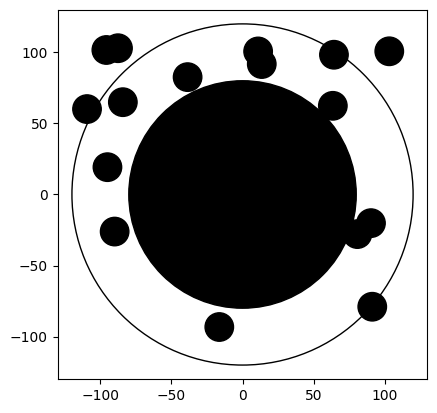

In [5]:
Number_of_planned_points_in_time = 25

# Create arrays to store X, Y, and Theta values
trajX = jnp.zeros(Number_of_planned_points_in_time)   # trajX is a skeleton for X values
trajY = jnp.zeros(Number_of_planned_points_in_time)   # trajY is a skeleton for Y values
trajTheta = np.zeros(Number_of_planned_points_in_time)   # trajTheta is a skeleton for Theta values

End_point = Number_of_planned_points_in_time * dt   # Calculate the end point based on the number of planned points and time step
Target_traj_in_time = jnp.arange(0.0, End_point, dt)   # Generate a time stamp array for the target trajectory

# Generate X and Y values for the target trajectory using a cosine and sine function
for time_instance in range(len(Target_traj_in_time)):
    trajX = trajX.at[time_instance].set(100 * jnp.cos((2.0 * np.pi / End_point) * Target_traj_in_time[time_instance]))
    trajY = trajY.at[time_instance].set(100 * jnp.sin((2.0 * np.pi / End_point) * Target_traj_in_time[time_instance]))

# Define the outer and inner circles
outer_circle = plt.Circle((0.0, 0.0), 120.0, facecolor='white', edgecolor='black')
inner_circle = plt.Circle((0.0, 0.0), 80.0, facecolor='black', edgecolor='black')

# Define the annular region
annulus_radius = 120.0 - 10.0  # Distance between outer and inner circles
annulus_center = (0.0, 0.0)

# Generate random positions within the annular region for obstacles
obstacle_positions = []
for i in range(16):
    while True:
        # Generate a random position within the annular region
        x = np.random.uniform(-1, 1) * annulus_radius
        y = np.random.uniform(-1, 1) * annulus_radius
        if np.sqrt(x ** 2 + y ** 2) >= 80.0:  # Check if the position is outside the inner circle
            obstacle_positions.append((x, y))
            break

# Create circle objects for the obstacles
obstacles = []
for position in obstacle_positions:
    obstacle = plt.Circle(position, 10.0, facecolor='black', edgecolor='black')
    obstacles.append(obstacle)

# Extract the coordinates of the obstacles
obstacle_coords = [obstacle.center for obstacle in obstacles]

# Create a plot and add the circles
fig, ax = plt.subplots()
ax.add_artist(outer_circle)
ax.add_artist(inner_circle)
for obstacle in obstacles:
    ax.add_artist(obstacle)

# Set the plot limits and aspect ratio
ax.set_xlim(-130, 130)
ax.set_ylim(-130, 130)
ax.set_aspect('equal')

# Show the plot
plt.show()

# Control Barrier Function

In [6]:
def CBF(x, y):
    h, k = 0.0, 0.0
    r_i = 80.0
    r_o = 120.0

    # Calculate the barrier functions for the inner and outer circles
    b_i = (x - h) ** 2 + (y - k) ** 2 - r_i ** 2
    b_o = -(x - h) ** 2 - (y - k) ** 2 + r_o ** 2

    # Initialize a list to store the barrier functions for obstacles
    obstacle_b = []

    # Calculate the barrier functions for each obstacle
    for obstacle_x, obstacle_y in obstacle_coords:
        b = (x - obstacle_x) ** 2 + (y - obstacle_y) ** 2 - 10 ** 2
        obstacle_b.append(b)

    # Check if all barrier functions are positive
    if b_i > 0 and b_o > 0 and all(b > 0 for b in obstacle_b):
        return True
    else:
        return False

# Finding nearest points to planned one

In [7]:
def findnearestnew(trajX, trajY, CarX, CarY, curind):
    # Calculate the Euclidean distance between each point in trajX, trajY and CarX, CarY
    distance = np.sqrt((trajX[curind:] - CarX) ** 2 + (trajY[curind:] - CarY) ** 2)

    # Find the minimum distance and its corresponding index
    Min_distance = np.amin(distance)
    Min_distance_index = np.where(distance == Min_distance)

    # Calculate the index of the minimum distance relative to the original trajX and trajY arrays
    Min_unvisited_distance_index = Min_distance_index[0][0] + curind

    # Return the index of the minimum distance and the actual distance
    return [Min_unvisited_distance_index, Min_distance]

# Creating Target Points

Text(0.5, 1.0, 'Target Trajectory Waypoints (x,y)')

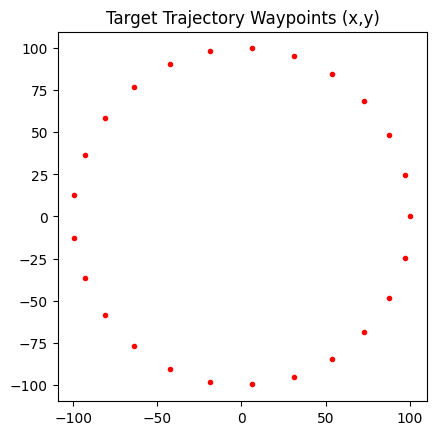

In [8]:
Total_Traj_Length = 0.0

# Iterate over each time instance in the target trajectory
for time_instance in range(1, len(Target_traj_in_time)):
    previous_position = jnp.array((trajX[time_instance - 1], trajY[time_instance - 1]))
    current_position = jnp.array((trajX[time_instance], trajY[time_instance]))

    # Calculate the heading vector from the previous position to the current position
    heading_vector = current_position - previous_position

    # Calculate the angle (theta) of the heading vector using arctan2
    trajTheta[time_instance] = np.arctan2(heading_vector[1], heading_vector[0])

    # Calculate the distance between the current and previous positions
    Distance_between_curr_prev_position = jnp.sqrt(heading_vector[0] ** 2 + heading_vector[1] ** 2)

    # Accumulate the total trajectory length
    Total_Traj_Length += Distance_between_curr_prev_position

finalX = trajX[len(Target_traj_in_time) - 1]  # X coordinate of the final target position
finalY = trajY[len(Target_traj_in_time) - 1]  # Y coordinate of the final target position

# Create a new figure and plot the target trajectory waypoints
plt.figure()
plt.plot(trajX, trajY, 'r.')
plt.axis('square')  # Set the aspect ratio of the plot to square
plt.title('Target Trajectory Waypoints (x,y)')

# Intial Values and Constants

In [9]:
Number_of_DriveSteps = 10 * Number_of_planned_points_in_time

# Arrays to store the drive steps data
xseries = np.zeros(Number_of_DriveSteps)
yseries = np.zeros(Number_of_DriveSteps)
thetaseries = np.zeros(Number_of_DriveSteps)
Dist2goseries = np.zeros(Number_of_DriveSteps)
deltaseries = np.zeros(Number_of_DriveSteps)
targetseries = np.full(Number_of_DriveSteps, 0 + 0 * 1j)
targetttx = np.zeros(Number_of_DriveSteps)
targettty = np.zeros(Number_of_DriveSteps)

# Initial values
xseries[0] = 100.0
yseries[0] = 0.0
thetaseries[0] = 90.0 * deg2rad
deltaseries[0] = 0.0

# Calculate the speed needed to stay on schedule
v = 1.0 * (Total_Traj_Length / Number_of_DriveSteps) / dt

# Set the initial target position as a complex number
targetseries[0] = np.cos(trajTheta[0]) + np.sin(trajTheta[0]) * 1j

# Constants
L = 1.0  # Length of the car
Prediction_horizon = 10  # Prediction horizon: number of steps to look ahead
maxsteerdeg = 3.0  # Maximum steering angle in degrees
steerstep = 1  # Steering angle step size

# Generate a range of control steering angles
control_steering = np.arange(-maxsteerdeg, +maxsteerdeg + steerstep, steerstep) * deg2rad

Number_of_trajectory = len(control_steering)  # Number of trajectories to consider

# Cost funtion and planning vector creation

In [10]:
# Represent trajectories used for planning
xplanseries = np.zeros((Number_of_DriveSteps,Number_of_trajectory,Prediction_horizon))
yplanseries = np.zeros((Number_of_DriveSteps,Number_of_trajectory,Prediction_horizon))
thetaplanseries = np.zeros((Number_of_DriveSteps,Number_of_trajectory,Prediction_horizon))

J = np.zeros((Number_of_DriveSteps,Number_of_trajectory)) # Store cost of each trajectory
minJ = np.zeros(Number_of_DriveSteps) # At each time step, what is the min value across each trajectory evaluated?
minJind = np.zeros(Number_of_DriveSteps) # At each time step, what is the index of the traj with min value?

for trajectory_num in range(Number_of_trajectory): # Each trajectory being considered
  xplanseries[0,trajectory_num,0] = xseries[0] # initialize planning trajectories to actual car start pose
  yplanseries[0,trajectory_num,0] = yseries[0]
  thetaplanseries[0,trajectory_num,0] = thetaseries[0]

# Implementing MPC with CBF

In [11]:
current_traj_point = 0
look_ahead_waypoints = 2
tolerance = 0 # How close should we be to final waypoint?

for i in range(0,Number_of_DriveSteps-1): # Actual driving steps
  for tr in range(Number_of_trajectory): # Each trajectory being considered
    J[i,tr] = 0.0 # Initialize cost

    [ref_traj_ind,ref_traj_dist] = findnearestnew(trajX,trajY,xseries[i],yseries[i],current_traj_point)   #finding nearest point on planned trajectory from current point
    cur_traj_point = ref_traj_ind                                                                         #updating current trajectory point

    ref_traj_pointX = trajX[np.mod(ref_traj_ind + look_ahead_waypoints,Number_of_planned_points_in_time)] 
    ref_traj_pointY = trajY[np.mod(ref_traj_ind+look_ahead_waypoints,Number_of_planned_points_in_time)]
    
    targetttx[i] = ref_traj_pointX  #update target X cooridnate
    targettty[i] = ref_traj_pointY  #update target Y cooridnate
    
    xplanseries[i,tr,0] = xseries[i]  # Assign the value of the i-th element of xseries to the [i,tr,0]-th element of xplanseries
    yplanseries[i,tr,0] = yseries[i]  # Assign the value of the i-th element of yseries to the [i,tr,0]-th element of yplanseries
    thetaplanseries[i,tr,0] = thetaseries[i] # Assign the value of the i-th element of thetaseries to the [i,tr,0]-th element of thetaplanseries
    
    for p in range(1,Prediction_horizon): # Each step in planning horizon
      [xplanseries[i,tr,p],yplanseries[i,tr,p],thetaplanseries[i,tr,p]] = carkin(control_steering[tr] ,v, thetaplanseries[i,tr,p-1],xplanseries[i,tr,p-1],yplanseries[i,tr,p-1],L,dt)
      dist2 = np.sqrt((ref_traj_pointX-xplanseries[i,tr,p])**2+(ref_traj_pointY-yplanseries[i,tr,p])**2)
      
      if CBF(xplanseries[i,tr,p], yplanseries[i,tr,p]) == True:
        J[i,tr] = J[i,tr]+dist2
      else:
        J[i,tr] = (1+J[i,tr]+dist2)*100

  minJ[i] = np.amin(J[i,:])
  minJindarr = np.where(J[i,:] == minJ[i])
  minJindtmp = minJindarr[0][0]
  minJind[i] = minJindtmp
  deltaseries[i] = control_steering[minJindtmp]
  
  [xseries[i+1],yseries[i+1],thetaseries[i+1]] = carkin(deltaseries[i],v,thetaseries[i],xseries[i],yseries[i],L,dt)
  dist2go = np.sqrt((xseries[i+1]-finalX)**2 + (yseries[i+1]-finalY)**2)
  Dist2goseries[i] = dist2go
  
  if (dist2go <= tolerance): # Are we there yet?
    v = 0 # if we're there, stop the car

# Creating GiF

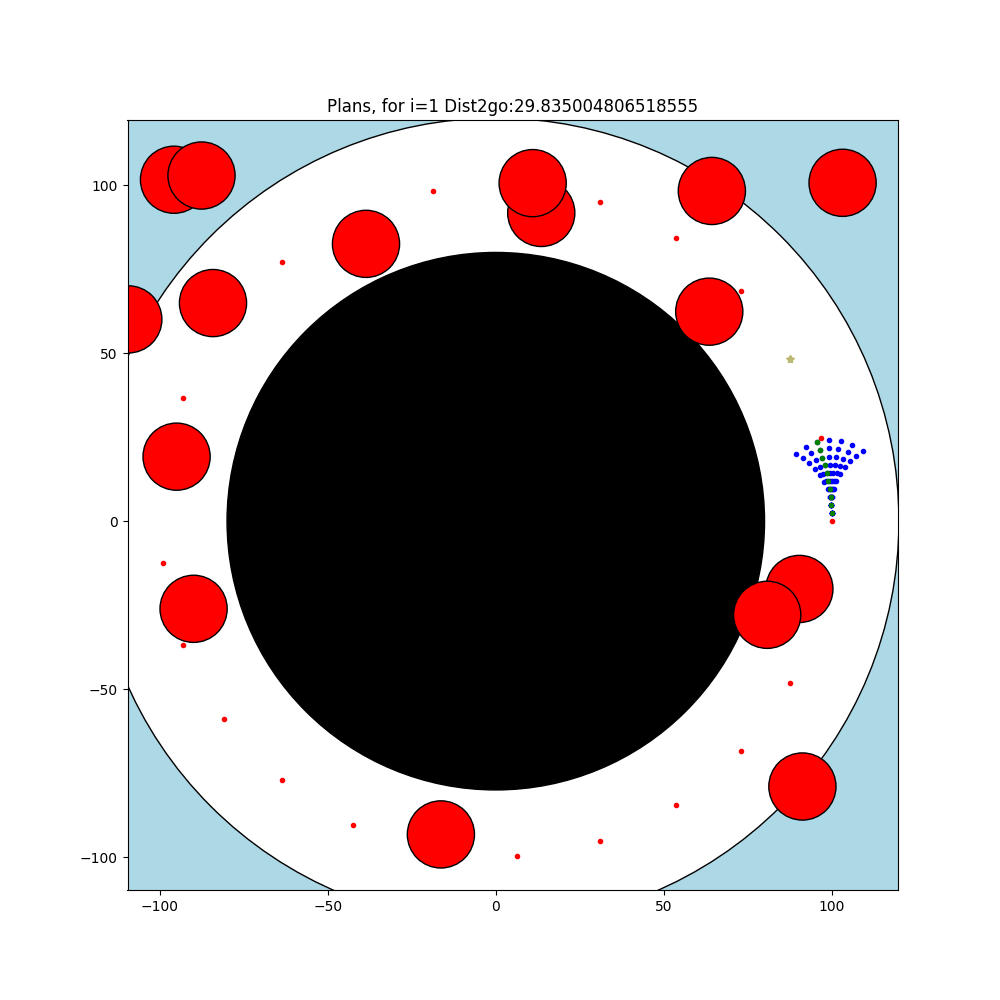

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

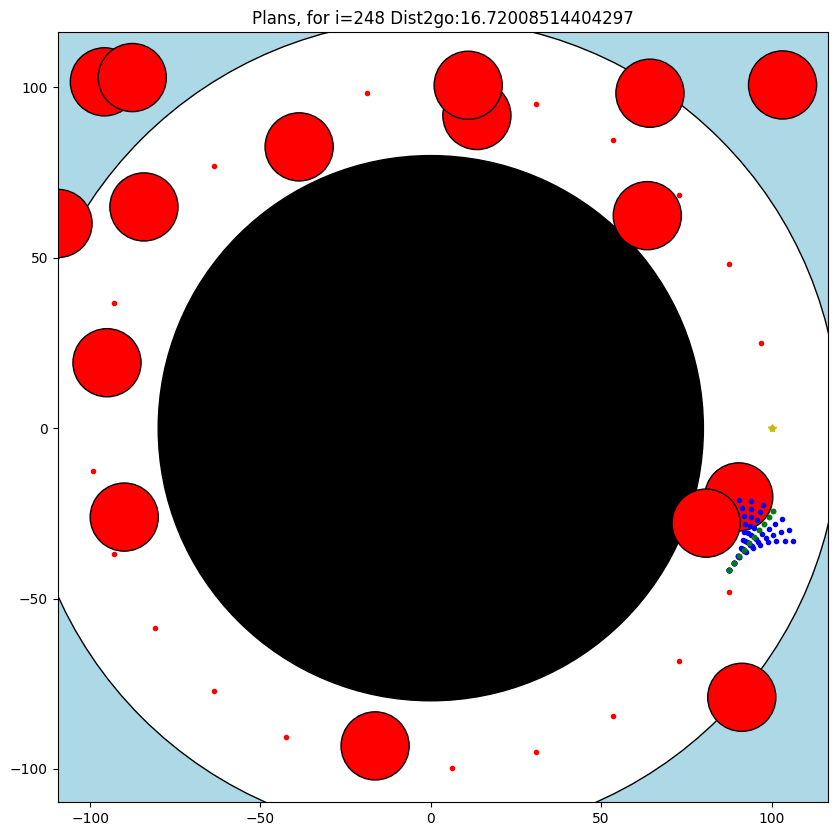

In [12]:
import time
import psutil
from datetime import datetime

# Set up the plot parameters
fig, ax = plt.subplots(figsize=(10, 10))
ax.set_facecolor('lightblue')
ax.set_xlim(-120, 120)
ax.set_ylim(-120, 120)
ax.set_aspect(1)

outer_circle = plt.Circle((0.0, 0.0), 120.0, facecolor='White', edgecolor='black')
inner_circle = plt.Circle((0.0, 0.0), 80.0, facecolor='black', edgecolor='black')

# Create a list to hold the obstacle circles
obstacles = []
for obstacle_coord in obstacle_coords:
    obstacle = plt.Circle(obstacle_coord, 10.0, facecolor='Red', edgecolor='black')
    obstacles.append(obstacle)

# Add the circles to the plot
ax.add_artist(outer_circle)
ax.add_artist(inner_circle)
for obstacle in obstacles:
    ax.add_artist(obstacle)

# Create an empty list to hold the frames of the animation
frames = []

# Loop over the steps
for i in range(1, Number_of_DriveSteps):
    if Dist2goseries[i] > tolerance:
        ax.clear()
        
        # Add the circles to the plot
        ax.add_artist(outer_circle)
        ax.add_artist(inner_circle)
        for obstacle in obstacles:
            ax.add_artist(obstacle)
        
        ax.set_title('Plans, for i=' + str(i) + ' Dist2go:' + str(Dist2goseries[i]))
        ax.plot(trajX, trajY, 'r.')
        
        for tr in range(Number_of_trajectory):
            ax.plot(xplanseries[i, tr, :], yplanseries[i, tr, :], 'b.')
        
        mintr = int(minJind[i])
        ax.plot(xplanseries[i, mintr, :], yplanseries[i, mintr, :], 'g.')
        ax.plot(targetttx[i], targettty[i], 'y*')
        ax.axis('square')
        
        # Add the current plot to the frames list
        fig.canvas.draw()
        frame = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
        frame = frame.reshape(fig.canvas.get_width_height()[::-1] + (3,))
        frames.append(frame)

# Create the GIF from the frames
imageio.mimsave('trajectory.gif', frames, fps=5)

# Display the GIF
with open('trajectory.gif', 'rb') as f:
    display.display(display.Image(data=f.read(), height=300))

# Download the GIF
files.download('trajectory.gif')